### Import all necessary packages

In [1]:
import s3fs; import xarray as xr; import numpy as np
import pandas as pd; import scipy
import matplotlib.pyplot as plt; import cartopy.crs as ccrs
import netCDF4 as nc; import datetime as dt
import ocetrac

import dask.array as da
import warnings; import expectexception
warnings.filterwarnings('ignore')
import intake; import pprint

import random
import nc_time_axis; import cftime; import datetime as dt
from scipy.optimize import curve_fit
import datetime
import scipy.stats as stats

In [2]:
# import visualization packages
import seaborn as sns
sns.set_theme(style="darkgrid")

### Preprocessing data files

In [3]:
# import data files
blobs_detrended_last40years = xr.open_dataset('blobs_detrended_last40years.nc') # blobs from Ocetrac
detrended_ens0_last40years = xr.open_dataset('detrended_ens0_last40years.nc')  # SST

In [4]:
combined_last40_detrendlin = xr.combine_by_coords([detrended_ens0_last40years, blobs_detrended_last40years])
event__last40_detrendlin = combined_last40_detrendlin.groupby(combined_last40_detrendlin.labels) # 242 groups

In [5]:
%%time
file = event__last40_detrendlin #event_NEP_rel

label_ls = []; time_begin_ls = []; time_end_ls = []; duration_ls = []; 
intense_mean = []; intense_max = []; intense_min = [];intense_cumu = []
coords_ls = []; cell_area_ls = []; lat_ls = []; lon_ls = []

for l, ent in file:        
    label_ls.append(l)
    groupedby_by_time = ent.groupby(ent.time)
    time_begin = str(ent.time[0].values); time_begin_ls.append(time_begin)
    time_end = str(ent.time[-1].values); time_end_ls.append(time_end)
        
    duration = len(ent.groupby("time")); duration_ls.append(duration)

    temp_intense_mean = []; temp_intense_max = []; temp_intense_min = []; temp_intense_cumu = []
    temp_coords = []; temp_cell_area = []; temp_lat = []; temp_lon = []
    for n, gro in groupedby_by_time:
        lat = gro.lat.values
        lon = gro.lon.values
        time = gro.time.values
                        
        intensity_mean_val = gro['__xarray_dataarray_variable__'].values.mean(); temp_intense_mean.append(intensity_mean_val)
        intensity_max_val = gro['__xarray_dataarray_variable__'].values.max(); temp_intense_max.append(intensity_max_val)
        intensity_min_val = gro['__xarray_dataarray_variable__'].values.min(); temp_intense_min.append(intensity_min_val)
        intensity_cumulative_val = gro['__xarray_dataarray_variable__'].values.sum(); temp_intense_cumu.append(intensity_cumulative_val)

        coords = list(zip(lat, lon)); temp_coords.append(coords)
        temp_lat.append(lat); temp_lon.append(lon)
        y,x=zip(*coords)
        dlon = [np.cos(y[c]*np.pi/180)*(111.320*1) for c in np.arange(0, len(coords))]
        dlat = (110.574 *1) * np.ones(len(dlon))
        cell_area = [np.sum(dlon[c]*dlat[c]) for c in np.arange(0, len(coords))]; temp_cell_area.append(np.sum(cell_area))

    intense_mean.append(temp_intense_mean)
    intense_max.append(temp_intense_max)
    intense_min.append(temp_intense_min) 
    intense_cumu.append(temp_intense_cumu)
    coords_ls.append(temp_coords)
    cell_area_ls.append(temp_cell_area)
    lat_ls.append(temp_lat)
    lon_ls.append(temp_lon)
        
    begin_dates_list = [dt.datetime.strptime(date, '%Y-%m-%d %H:%M:%S').date() for date in time_begin_ls]
    
    end_dates_list = [dt.datetime.strptime(date, '%Y-%m-%d %H:%M:%S').date() for date in time_end_ls]

my_df_rel = pd.DataFrame(zip(label_ls, begin_dates_list, end_dates_list, duration_ls,
                         intense_mean, intense_max, intense_min, intense_cumu,
                         coords_ls, cell_area_ls, lat_ls, lon_ls, time_begin_ls, time_end_ls), 
                     columns = ['label', 'time_begin', 'time_end', 'duration',
                                'intense_mean', 'intense_max', 'intense_min','intense_cumu',
                                'coords','cell_area','lat','lon', 'time_begin_ls','time_end_ls'])

my_xarray_rel = my_df_rel.to_xarray() 

CPU times: user 12.5 s, sys: 75.9 ms, total: 12.6 s
Wall time: 13.3 s


In [6]:
my_xarray_rel

<xarray.Dataset>
Dimensions:        (index: 242)
Coordinates:
  * index          (index) int64 0 1 2 3 4 5 6 7 ... 235 236 237 238 239 240 241
Data variables: (12/14)
    label          (index) float64 1.0 2.0 3.0 4.0 ... 239.0 240.0 241.0 242.0
    time_begin     (index) object 1975-01-01 1975-01-01 ... 2015-01-01
    time_end       (index) object 1975-06-01 1975-01-01 ... 2015-01-01
    duration       (index) int64 6 1 9 6 2 7 9 2 17 13 ... 5 1 2 14 1 1 16 2 1 1
    intense_mean   (index) object [1.006577330455464, 1.2313942680746968, 1.4...
    intense_max    (index) object [1.9071057584885125, 2.3259634643455342, 2....
    ...             ...
    coords         (index) object [[(-51.361256544502616, 130.0), (-51.361256...
    cell_area      (index) object [8326488.004199062, 6953795.599980992, 6342...
    lat            (index) object [array([-51.36125654, -51.36125654, -51.361...
    lon            (index) object [array([130.  , 131.25, 132.5 , 133.75, 135...
    time_begin_ls  (index) object '1975-01-01 00:00:00' ... '2015-01-01 00:00...
    time_end_ls    (index) object '1975-06-01 00:00:00' ... '2015-01-01 00:00...

In [7]:
#### Checking
# print(my_xarray_rel['intense_mean'][0])
# print(my_xarray_rel['intense_max'][0])
# print(my_xarray_rel['intense_min'][0])
# print(my_xarray_rel['intense_cumu'][0])
# # print(my_xarray_rel['coords'][0])
# print(my_xarray_rel['cell_area'][0])

### Preprocessing data

In [8]:
asxarray= my_xarray_rel.to_array()
asnparray = asxarray.to_numpy()

In [9]:
# time_begin extract the months
time_begin_extract =np.array([np.datetime64(x.isoformat(),'s') for x in asnparray[1]])
temp_b=time_begin_extract.astype('datetime64[M]')

begin_months = temp_b.astype('datetime64[M]').astype(int) % 12 + 1

In [10]:
# time_end extract the months
time_end_extract =np.array([np.datetime64(x.isoformat(),'s') for x in asnparray[2]])
temp_b=time_end_extract.astype('datetime64[M]')

end_months = temp_b.astype('datetime64[M]').astype(int) % 12 + 1

In [11]:
duration = asnparray[3]
intense_mean_ = asnparray[4]
intense_max_ = asnparray[5]
intense_min_ = asnparray[6]
intense_cumu_ = asnparray[7]
cell_area_ = asnparray[9]

In [12]:
my_xarray_rel['intense_mean'][0]

<xarray.DataArray 'intense_mean' ()>
array(list([1.006577330455464, 1.2313942680746968, 1.440623395281939, 1.5264700513390068, 1.1675330737815388, 1.2196964792616698]),
      dtype=object)
Coordinates:
    index    int64 0

In [15]:
max_of_mean_vals = list([max(map(float, i)) for i in intense_mean_])
max_of_max_vals = list([max(map(float, i)) for i in intense_max_])
max_of_min_vals = list([max(map(float, i)) for i in intense_min_])
max_of_cumu_vals = list([max(map(float, i)) for i in intense_cumu_])
max_of_cell_area = list([max(map(float, i)) for i in cell_area_])

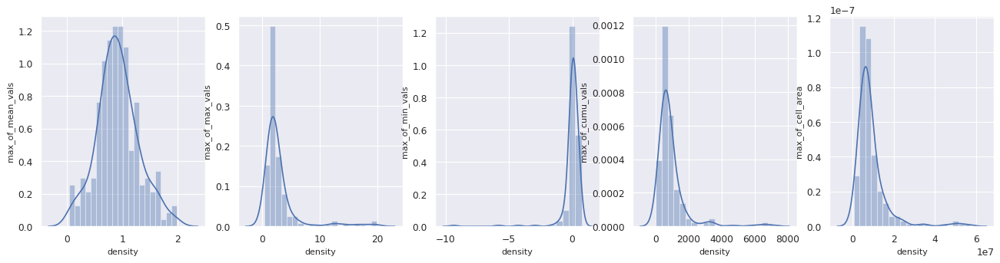

In [25]:
variables_ls = [begin_months, end_months, max_of_mean_vals, max_of_max_vals, max_of_min_vals, max_of_cumu_vals, max_of_cell_area]
variables_labels = ['begin_months', 'end_months', 'max_of_mean_vals', 'max_of_max_vals', 'max_of_min_vals', 'max_of_cumu_vals', 'max_of_cell_area']

f = plt.figure(figsize=(20, 10), dpi=80)
for i in range(2, len(variables_ls)):
    f.add_subplot(2, 5, i-1)
    sns.distplot(variables_ls[i], bins=20, kde=True, hist=True)
    # plt.hist(variables_ls[i], bins=20)
    plt.xlabel('density',fontsize=10)
    plt.ylabel(variables_labels[i],fontsize=10)
plt.show()

In [28]:
def find_q1_q3(data):
    q1 = np.percentile(data,25)
    q3 = np.percentile(data,75)
    return q1, q3

q1, q3 = find_q1_q3(max_of_mean_vals)
print(q1)
print(q3)

0.7016570012453346
1.111251629245109


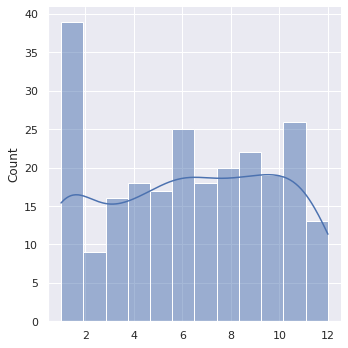

In [29]:
sns.displot(begin_months, bins=12, kde=True)

In [ ]:
# check when the longer than 1 month long heatwaves start

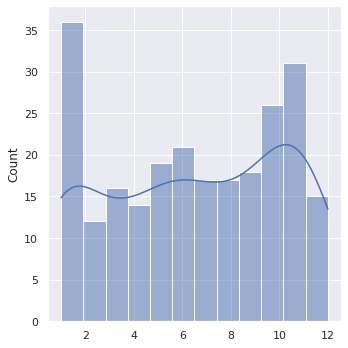

In [30]:
sns.displot(end_months, bins=12, kde=True)

1.0
4.0


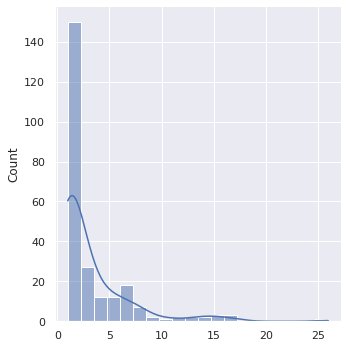

In [33]:
sns.displot(duration, bins=20, kde=True)

q1, q3 = find_q1_q3(duration)
print(q1)
print(q3)

In [36]:
coords_ = asnparray[8]
lat_ = asnparray[10]
lon_ = asnparray[11]

In [37]:
intensity_max_all = []
for i in intense_max_:
    intensity_max_all.append(np.nanmax(i))

intensity_mean_all = []
for i in intense_mean_:
    intensity_mean_all.append(np.nanmean(i))
    
intensity_cumu_all = []
for i in intense_cumu_:
    intensity_cumu_all.append(np.nanmax(i))   
    
cell_area_all = []
for i in cell_area_:
    cell_area_all.append(np.nanmax(i))       

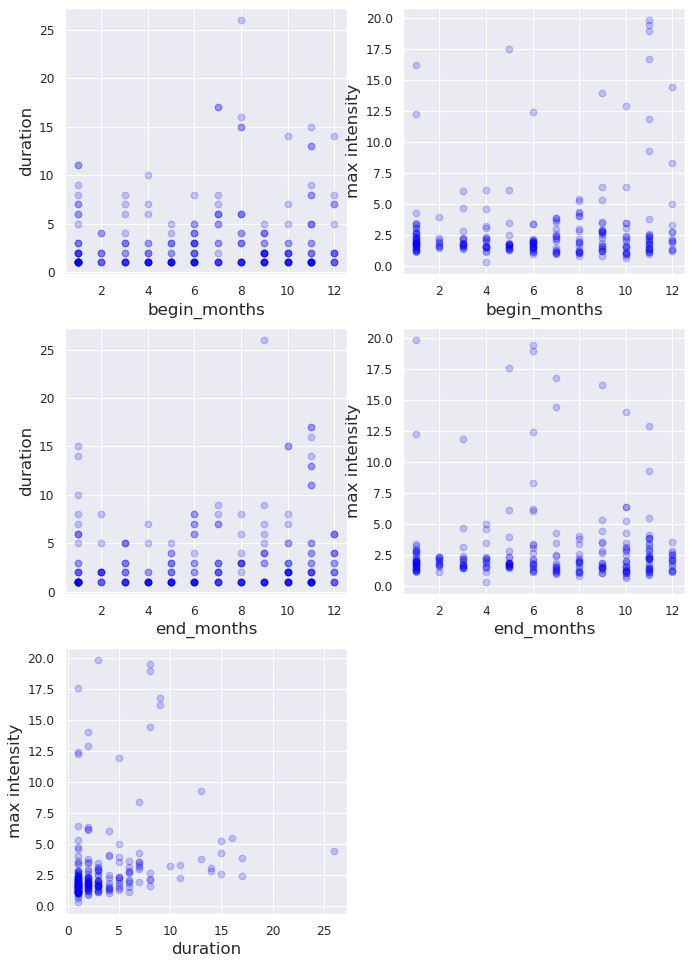

In [38]:
fig = plt.figure(figsize=(10, 15), dpi=80)
plt.subplot(3, 2, 1)
plt.scatter(begin_months, duration, alpha=.2, c='blue')
plt.ylabel('duration', fontsize=15)
plt.xlabel('begin_months', fontsize=15)

plt.subplot(3, 2, 2)
plt.scatter(begin_months, intensity_max_all, alpha=.2,c='blue')
plt.ylabel('max intensity', fontsize=15)
plt.xlabel('begin_months', fontsize=15)

plt.subplot(3, 2, 3)
plt.scatter(end_months, duration, alpha=.2,c='blue')
plt.ylabel('duration', fontsize=15)
plt.xlabel('end_months', fontsize=15)

plt.subplot(3, 2, 4)
plt.scatter(end_months, intensity_max_all, alpha=.2,c='blue')
plt.ylabel('max intensity', fontsize=15)
plt.xlabel('end_months', fontsize=15)

plt.subplot(3, 2, 5)
plt.scatter(duration, intensity_max_all, alpha=.2,c='blue')
plt.ylabel('max intensity', fontsize=15)
plt.xlabel('duration', fontsize=15)

plt.show()

## Principal Component Analysis

In [39]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.linear_model import RidgeCV

In [40]:
attributes_df = pd.DataFrame(
    {'begin_months': begin_months,
     'duration': duration,
     'intensity_max_all': intensity_max_all,
     'intensity_mean_all': intensity_mean_all,
     'cell_area_all': cell_area_all
    })

In [41]:
scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(attributes_df)

In [42]:
N = int(features_normal.shape[0])
X = features_normal

In [43]:
mean_data = np.mean(X,0)
centered_X_train = X - mean_data

In [44]:
centered_X_train.shape

(242, 5)

In [45]:
centered_X_train

array([[-0.48309542,  0.11157025, -0.01005664,  0.2703868 , -0.00874104],
       [-0.48309542, -0.08842975, -0.07066313, -0.02032452,  0.08549646],
       [-0.48309542,  0.23157025,  0.68184531, -0.07407561,  0.43798469],
       ...,
       [ 0.24417731, -0.04842975,  0.17872502, -0.08489694, -0.0592455 ],
       [ 0.42599549, -0.08842975, -0.03820103,  0.03615854, -0.06674543],
       [-0.48309542, -0.08842975, -0.08560888, -0.1250642 ,  0.00776361]])

In [46]:
pca = PCA(n_components = 5)
pca.fit(centered_X_train) #X_train_standard

PCA(n_components=5)

In [47]:
nuclear_norm = np.linalg.norm(pca.singular_values_) # is the sum of singular singulars
sv_scaled = pca.singular_values_**2/(nuclear_norm**2) 
# sv_scaled = pca.explained_variance_ratio_
sv_total = np.cumsum(pca.singular_values_**2)/(nuclear_norm**2)

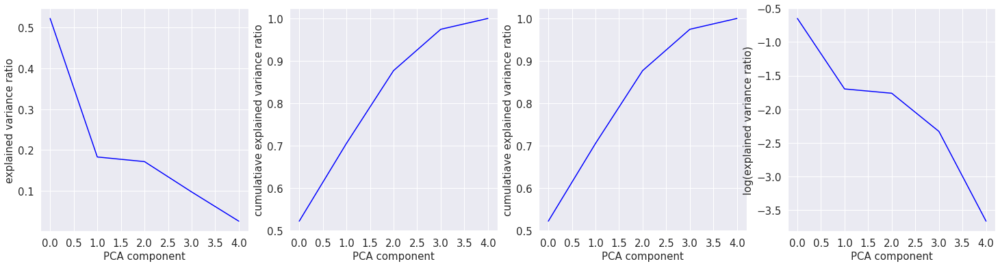

In [48]:
plt.rcParams["figure.figsize"] = (25,6)

plt.subplot(1, 4, 1)
plt.plot(sv_scaled, 'blue') # equivalent to pca.explained_variance_ratio_
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.xlabel('PCA component', fontsize=15)
plt.ylabel('explained variance ratio', fontsize=15)

plt.subplot(1, 4, 2)
plt.plot(sv_total, 'blue')
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.xlabel('PCA component', fontsize=15)
plt.ylabel('cumulatiave explained variance ratio', fontsize=15)

plt.subplot(1, 4, 3)
plt.plot(sv_total[:30], 'blue')
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.xlabel('PCA component', fontsize=15)
plt.ylabel('cumulatiave explained variance ratio', fontsize=15)

plt.subplot(1, 4, 4)
plt.plot(np.log(sv_scaled),'blue') # equivalent to np.log(pca.singular_values_)
plt.xticks(fontsize=15); plt.yticks(fontsize=15)
plt.xlabel('PCA component', fontsize=15)
plt.ylabel('log(explained variance ratio)', fontsize=15)

plt.show()

In [49]:
pca_total = PCA(n_components=5)
pca_total.fit(centered_X_train)
frobenius_norm = np.sqrt(sum(pca_total.singular_values_**2))

In [ ]:
def no_pca_modes(ratio):
    pca_test = PCA(n_components=1)
    pca_test.fit(centered_X_train)
    np.sqrt(sum(pca_test.singular_values_**2))
    i = 1
    while np.sqrt(sum(pca_test.singular_values_**2)) < ratio*frobenius_norm:
        i += 1
        pca_test = PCA(n_components=i)
        pca_test.fit(centered_X_train)
    return i

print('Number of PCA modes to keep to approximate X_train up to 60%: ', no_pca_modes(0.6))
print('Number of PCA modes to keep to approximate X_train up to 80%: ',no_pca_modes(0.8))
print('Number of PCA modes to keep to approximate X_train up to 90%: ',no_pca_modes(0.9))

In [32]:
principalComponents = pca.fit_transform(centered_X_train)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])

## K-means Clustering

In [91]:
import sklearn as skl
import sklearn.cluster # apply K-mean clustering to dataset to discover clusters 
import scipy.spatial 

In [92]:
# attributes = np.stack((begin_months,end_months,duration, intensity_max_all,intensity_mean_all,intensity_cumu_all, cell_area_all),axis=-1)
# attributes = np.stack((begin_months,duration, intensity_max_all,intensity_mean_all, cell_area_all),axis=-1)
# attributes = np.stack((begin_months,duration, intensity_max_all, cell_area_all),axis=-1)
attributes = np.stack((duration, intensity_max_all, cell_area_all),axis=-1)

# attributes = np.stack((duration, intensity_cumu_all, cell_area_all),axis=-1)
attributes.shape

(242, 3)

In [93]:
scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(attributes)

In [94]:
N = int(features_normal.shape[0])
X = features_normal

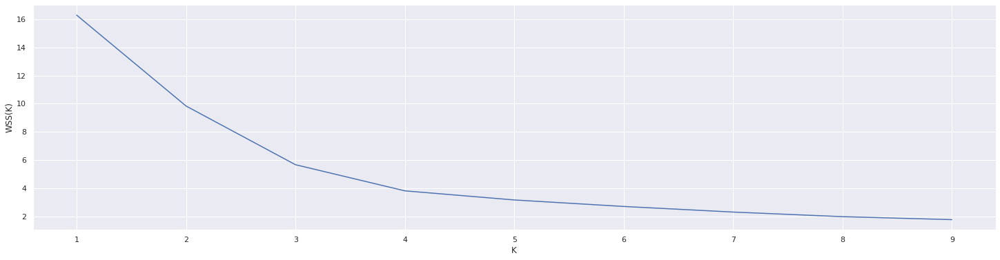

In [39]:
# Elbow plot
KK = np.arange(1,10)
WSS = []

for j in range(len(KK)):
    KMM = skl.cluster.KMeans(n_clusters=KK[j], random_state=0)
    KMM.fit(X)

    centroids = KMM.cluster_centers_
    Y_pred = KMM.labels_

  # compute WSS 
    wss = 0
    for i in range(N):
        current_cents = centroids[Y_pred[i]]
        wss += np.linalg.norm( X[i] - current_cents )**2

    WSS.append(wss)

plt.plot(KK, WSS)
plt.xlabel('K')
plt.ylabel('WSS(K)')
plt.show()

In [40]:
K = 4 #5

KMM = skl.cluster.KMeans(n_clusters=K, random_state=0).fit(X)
Y_pred = np.array(KMM.labels_, dtype=float) # predicted clusters by K-means

print(Y_pred.shape)
print(KMM.cluster_centers_.shape)
print(X.shape)

labels = pd.DataFrame(KMM.labels_)
labeledattributes = pd.concat((attributes_df,labels),axis=1)
labeledattributes = labeledattributes.rename({0:'labels'},axis=1)

(242,)
(4, 3)
(242, 3)


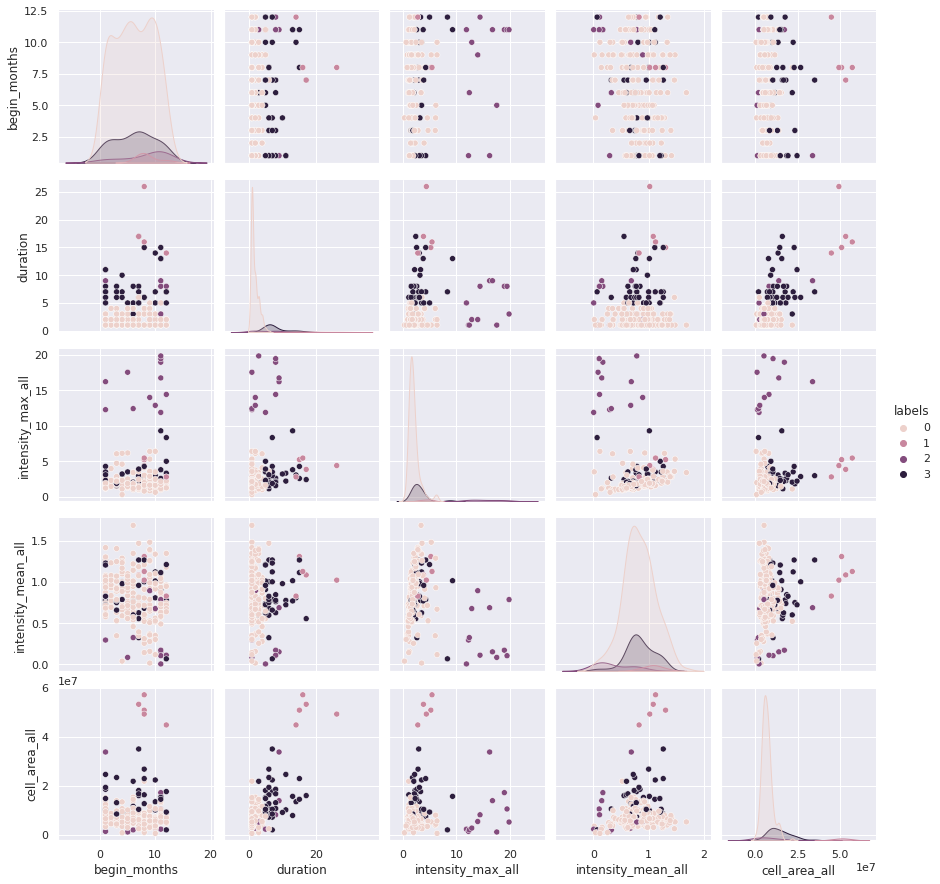

In [41]:
sns.pairplot(labeledattributes,hue='labels')

In [42]:
for feature in range(X.shape[1]):
    mean1 = X[KMM.labels_==0][:,feature].mean()
    mean2 = X[KMM.labels_==1][:,feature].mean()
    
    var1 = X[KMM.labels_==0][:,feature].var()
    var2 = X[KMM.labels_==1][:,feature].var()
    
    print('feature:',feature,'Mean difference:',round(abs(mean1-mean2),3),'Total Variance:',round((var1+var2),3))

feature: 0 Mean difference: 0.633 Total Variance: 0.032
feature: 1 Mean difference: 0.12 Total Variance: 0.005
feature: 2 Mean difference: 0.783 Total Variance: 0.008


In [48]:
cluster_center = KMM.cluster_centers_
print(cluster_center)
unnormalized_cluster_center = scaler.inverse_transform(cluster_center)
print(unnormalized_cluster_center)
# duration, intensity_max_all, cell_area_all
# maximum cell area 

#### ----------------------------------------  March 3, 2022 Notes
# cluster center in latitude and longitude 
# alternative: location of the largest piece 

# biggest footprint # picking out one spot where it is biggest (even when the event is separated into multiple blob-pieces)
# Where is this biggest footprint for the blobs? (NE Pacific)

# Tropical Pacific variability

[[0.03053763 0.08695528 0.10989411]
 [0.664      0.20655232 0.89288187]
 [0.15       0.78034527 0.14274205]
 [0.27179487 0.13960918 0.24287269]]
[[1.76344086e+00 2.00226748e+00 6.79739086e+06]
 [1.76000000e+01 4.34010145e+00 5.11695633e+07]
 [4.75000000e+00 1.55563709e+01 8.65889448e+06]
 [7.79487179e+00 3.03152429e+00 1.43333307e+07]]


In [81]:
cluster_labels = KMM.labels_
cluster_labels

array([3, 0, 2, 3, 0, 3, 2, 0, 3, 3, 2, 3, 1, 0, 3, 2, 0, 0, 0, 3, 0, 0,
       2, 3, 0, 0, 3, 0, 2, 3, 0, 2, 0, 2, 0, 0, 1, 0, 3, 0, 2, 0, 0, 0,
       0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 3, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3,
       0, 0, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 1,
       0, 3, 0, 0, 0, 0, 3, 2, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 2, 3, 0, 0,
       0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0],
      dtype=int32)

In [86]:
cluster0 = np.count_nonzero(cluster_labels == 0)
cluster1 = np.count_nonzero(cluster_labels == 1)
cluster2 = np.count_nonzero(cluster_labels == 2)
cluster3 = np.count_nonzero(cluster_labels == 3)
print(cluster0/242) 
print(cluster1/242) # long
print(cluster2/242) # intense
print(cluster3/242)

0.768595041322314
0.02066115702479339
0.049586776859504134
0.16115702479338842


In [85]:
print(cluster0+cluster1+cluster2+cluster3)

242


In [50]:
def eta(tt, rr):
    val = tt <= rr 
    return val.astype(float)

In [70]:
attributes = np.stack((duration, cell_area_all),axis=-1)

scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(attributes)

N = int(features_normal.shape[0])
X = features_normal

In [72]:
dist = scipy.spatial.distance_matrix( X, X, p =2)
r = 0.2
W = eta( dist, r)

In [73]:
import networkx as nx

G = nx.Graph()

for i in range(N):
    for j in range(N):
        if i != j and W[i,j] != 0 :
            G.add_edge(i, j, weight=W[i,j])

Text(0.5, 1.0, 'Proximity Graph')

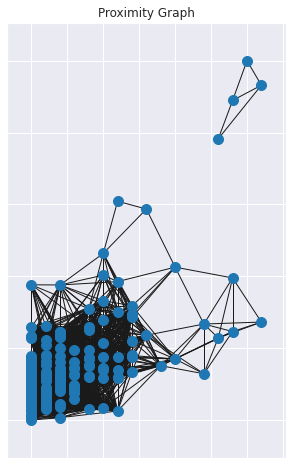

In [75]:
fig, ax = plt.subplots(1,1, figsize=(8,8))

nx.draw_networkx_nodes(G, X, node_size=100, ax = ax)
nx.draw_networkx_edges(G, X, ax = ax)
ax.set_aspect('equal')
ax.set_title('Proximity Graph')

In [ ]:
## trying this

## Hierarchical Clustering

In [95]:
import scipy.cluster.hierarchy as sch

In [96]:
X.shape

(242, 3)

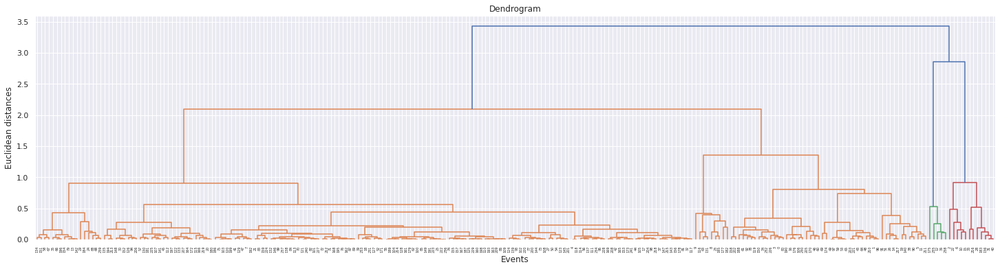

In [97]:
#Lets create a dendrogram variable 
# linkage is actually the algorithm itself of hierarchical clustering and then in 
#linkage we have to specify on which data we apply and engage. This is X dataset
dendrogram = sch.dendrogram(sch.linkage(X, method  = "ward"))
# The Ward method is a method that attempts to reduce variance within each cluster
plt.title('Dendrogram')
plt.xlabel('Events')
plt.ylabel('Euclidean distances')
plt.show()

In [ ]:
#4 Fitting hierarchical clustering to the Mall_Customes dataset
# There are two algorithms for hierarchical clustering: Agglomerative Hierarchical Clustering and 
# Divisive Hierarchical Clustering. We choose Euclidean distance and ward method for our 
# algorithm class  

In [ ]:
sns.swarmplot(x=X[:,2],y=X[:,1],hue=Y_pred)

In [ ]:
datetimeindex_blobs_rel

In [ ]:

begin_year = datetimeindex_blobs_rel[0].year
begin_month = datetimeindex_blobs_rel[0].month

end_year = datetimeindex_blobs_rel[-1].year
end_month = datetimeindex_blobs_rel[-1].month

begin_time_index = get_time_index(begin_year, begin_month)
end_time_index = get_time_index(end_year, end_month)

In [12]:
mhw_id = 0.
mhw_event_rel = combined_last40_detrendlin.where(combined_last40_detrendlin.labels==mhw_id, drop=False)
mhw_event_rel_true_drop = combined_last40_detrendlin.where(combined_last40_detrendlin.labels==mhw_id, drop=True)

In [34]:
combined_last40_detrendlin

<xarray.Dataset>
Dimensions:                        (time: 481, lat: 192, lon: 288)
Coordinates:
  * time                           (time) object 1975-01-01 00:00:00 ... 2015...
  * lat                            (lat) float64 -90.0 -89.06 ... 89.06 90.0
  * lon                            (lon) float64 0.0 1.25 2.5 ... 357.5 358.8
    member_id                      <U11 'r1i1001p1f1'
    quantile                       float64 ...
    month                          (time) int64 1 2 3 4 5 6 7 ... 8 9 10 11 12 1
Data variables:
    __xarray_dataarray_variable__  (time, lat, lon) float64 0.0 0.0 ... -0.01539
    labels                         (time, lat, lon) float64 nan nan ... nan nan

In [36]:
datetimeindex_blobs_rel = combined_last40_detrendlin.indexes['time'].to_datetimeindex()

begin_year = datetimeindex_blobs_rel[0].year
begin_month = datetimeindex_blobs_rel[0].month

end_year = datetimeindex_blobs_rel[-1].year
end_month = datetimeindex_blobs_rel[-1].month

In [38]:
datetimeindex_blobs_rel

DatetimeIndex(['1975-01-01', '1975-02-01', '1975-03-01', '1975-04-01',
               '1975-05-01', '1975-06-01', '1975-07-01', '1975-08-01',
               '1975-09-01', '1975-10-01',
               ...
               '2014-04-01', '2014-05-01', '2014-06-01', '2014-07-01',
               '2014-08-01', '2014-09-01', '2014-10-01', '2014-11-01',
               '2014-12-01', '2015-01-01'],
              dtype='datetime64[ns]', length=481, freq=None)

NameError: name 'end_time_index' is not defined

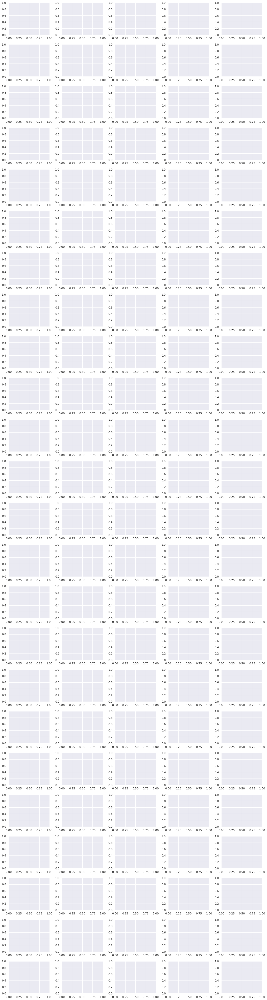

In [13]:
fig, axs = plt.subplots(24,5, figsize=(18, 72), facecolor='w', edgecolor='k')

fig.subplots_adjust(hspace = .3, wspace=.3)

axs = axs.ravel()

for i in range(end_time_index-begin_time_index):
    mhw_event_slice = mhw_event_rel.__xarray_dataarray_variable__[begin_time_index+i,:,:]
    mhw_event_slice = mhw_event_rel.__xarray_dataarray_variable__[begin_time_index+i,:,:]
    axs[i].imshow(mhw_event_slice, vmin=0,vmax=5)
    axs[i].add_patch(Rectangle((lon_lim_less, lat_lim_less), lon_lim_great - lon_lim_less, lat_lim_great-lat_lim_less,facecolor='None', edgecolor='red'))
    axs[i].set_title(str(begin_time_index+i),fontsize=15)

In [ ]:
# North Pacific MHWs - check how many are present in one ensemble member